Import the necessary modules and packages

In [1]:
import os
os.chdir('..')

In [1]:
import os
import pandas as pd
from textflow.Test import Test
from textflow.Visualization import Visualization

In [2]:
df = pd.read_csv('c:\\Users\\UJA\\Desktop\\textflow\\Examples\\df_trans_merged_textflow.csv')
df = df.drop(['Unnamed: 0'],axis=1)

In [3]:
df

,id_PRECOM,Sexo,Edad,Criterio,text,volumetrywords,volumetryuniqueWords,volumetrychars,volumetryavgWordsLen,stylometryuniqueWords,...,lexicalDiversitySimpleTTR,lexicalDiversityRootTTR,lexicalDiversityLogTTR,lexicalDiversityMaasTTR,lexicalDiversityMSTTR,lexicalDiversityMATTR,lexicalDiversityHDD,lexicalDiversityMTLD,lexicalDiversityMTLDMAWrap,lexicalDiversityMTLDMABi
0,CO_5,Chico,13,Selectiva,No. La primera vez que gané... pues me sentí b...,210,132,1159,6,64,...,0.318352,5.201916,0.795141,0.084425,0.572000,0.571560,0.646932,25.919298,23.172285,22.020526
1,CO_11,Chica,16,Sana,Me desconecto un poco de lo que es... el estré...,409,196,2101,5,108,...,0.269547,5.942281,0.788075,0.078881,0.662222,0.641922,0.708650,32.587322,32.934156,32.901511
2,CHF_8,Chica,14,Selectiva,Pues diversión a veces también y también a vec...,141,88,743,5,40,...,0.388235,5.061969,0.815775,0.082596,0.620000,0.640496,0.653793,26.511682,26.841176,26.991648
3,CHF_7,Chico,15,Selectiva,Le explicaría que es como una realidad virtual...,598,261,3045,5,169,...,0.274336,7.143287,0.801600,0.070076,0.658462,0.654340,0.711610,31.927581,33.143068,32.918554
4,CHF_14,Chica,14,Selectiva,"Porque es como... No sé, o sea, no le veo impo...",286,149,1500,5,76,...,0.298507,5.463584,0.792065,0.082349,0.683333,0.676573,0.699070,39.990750,36.262687,36.898698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,JA_26,Chico,13,Clínica,Sí. Al Fortnite. Me gusta mucho jugar. Y hablo...,120,85,612,5,38,...,0.394737,4.866643,0.814976,0.084801,0.593333,0.588350,0.625466,23.523810,22.243421,21.470985
140,JA_25,Chica,14,Clínica,"Pues la verdad porque no está en persona, no c...",1087,358,5479,5,190,...,0.151062,5.385530,0.735565,0.085188,0.621600,0.621718,0.696784,29.910022,28.863100,29.083484
141,HA_1,Chico,12,Clínica,"Emoción. No, simplemente pues... digo, bueno, ...",367,198,1996,5,96,...,0.270563,5.815526,0.786939,0.079959,0.660000,0.662567,0.690977,33.551131,32.443723,32.965857
142,CZ_3,Chico,15,Clínica,"No sé... Yo creo que a mí pues no sé, no me di...",325,174,1606,5,79,...,0.267176,5.296549,0.779061,0.085160,0.637143,0.634826,0.680475,29.826615,29.913486,30.169811


In [4]:
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import WordPunctTokenizer
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\UJA\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
from textflow.POSAnalyzer import POSAnalyzer
from textflow.NGramsAnalyzer import NGramsAnalyzer
from textflow.SequenceString import SequenceString

listSequence = []
for index, row in df.iterrows(): 
  s = SequenceString(row["text"])
  listSequence.append(s)
  
#Creamos los analizadores
pos = POSAnalyzer()
n1 = NGramsAnalyzer(ngramsSize = 1)
n2 = NGramsAnalyzer(ngramsSize = 2)
n3 = NGramsAnalyzer(ngramsSize = 3)
n4 = NGramsAnalyzer(ngramsSize = 4)

for s in listSequence:
  pos.analyze(s,"POS","text")
  n1.analyze(s,"1-grams","text")
  n2.analyze(s,"2-grams","text")
  n3.analyze(s,"3-grams","text")
  n4.analyze(s,"4-grams","text")

labels = ["POS","1-grams","2-grams","3-grams","4-grams"]

dicTotal = {}

for seq in listSequence:
  for l in seq.metadata:
    if l in labels:
      for key in seq.metadata[l][0]:
        l_key = str(l+key)
        dicTotal[l_key] = dicTotal.get(l_key, []) + [seq.metadata[l][0][key]]

for k in dicTotal:
  df[str(k)] = dicTotal[k]

df

✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')


c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


,id_PRECOM,Sexo,Edad,Criterio,text,volumetrywords,volumetryuniqueWords,volumetrychars,volumetryavgWordsLen,stylometryuniqueWords,...,POSRelFreqPOS,POSPOSTokens,1-gramsn-grams,1-gramsfreqN-Grams,2-gramsn-grams,2-gramsfreqN-Grams,3-gramsn-grams,3-gramsfreqN-Grams,4-gramsn-grams,4-gramsfreqN-Grams
0,CO_5,Chico,13,Selectiva,No. La primera vez que gané... pues me sentí b...,210,132,1159,6,64,...,"{'ADV': 0.10112359550561797, 'PUNCT': 0.213483...","{'ADV': {'No': 5, 'bien': 1, 'ya': 2, 'mismo':...","[así, bien, bueno,, básicamente, casi, como......","{'así': 1, 'bien': 1, 'bueno,': 1, 'básicament...","[así que,, bien está., bueno, pues, bueno, vec...","{'así que,': 1, 'bien está.': 1, 'bueno, pues'...","[así que, gusta, bien está. que..., bueno, pue...","{'así que, gusta': 1, 'bien está. que...': 1, ...","[así que, gusta ganar., bien está. que... gust...","{'así que, gusta ganar.': 1, 'bien está. que....."
1,CO_11,Chica,16,Sana,Me desconecto un poco de lo que es... el estré...,409,196,2101,5,108,...,"{'PRON': 0.09465020576131687, 'VERB': 0.137860...","{'PRON': {'Me': 2, 'lo': 11, 'que': 5, 'me': 8...","[14, amigos, amigos,, antes., aplicación, apre...","{'14': 1, 'amigos': 1, 'amigos,': 1, 'antes.':...","[14 así,, amigos pues, amigos, empecé, antes. ...","{'14 así,': 1, 'amigos pues': 1, 'amigos, empe...","[14 así, empecé, amigos pues pasas, amigos, em...","{'14 así, empecé': 1, 'amigos pues pasas': 1, ...","[14 así, empecé antes., amigos pues pasas mome...","{'14 así, empecé antes.': 1, 'amigos pues pasa..."
2,CHF_8,Chica,14,Selectiva,Pues diversión a veces también y también a vec...,141,88,743,5,40,...,"{'SCONJ': 0.11176470588235295, 'VERB': 0.15882...","{'SCONJ': {'Pues': 4, 'que': 8, 'cuando': 2, '...","[aburro, amigos, bien,, bien., cosa, decepción...","{'aburro': 1, 'amigos': 1, 'bien,': 1, 'bien.'...","[aburro también,, amigos y..., bien, no..., bi...","{'aburro también,': 1, 'amigos y...': 1, 'bien...","[aburro también, nada., amigos y... sé, bien, ...","{'aburro también, nada.': 1, 'amigos y... sé':...","[aburro también, nada. gustan, amigos y... sé ...","{'aburro también, nada. gustan': 1, 'amigos y...."
3,CHF_7,Chico,15,Selectiva,Le explicaría que es como una realidad virtual...,598,261,3045,5,169,...,"{'PRON': 0.09734513274336283, 'VERB': 0.128318...","{'PRON': {'Le': 1, 'que': 16, 'se': 3, 'yo': 4...","[8-9, acaba, acción,, acostumbrado, acostumbra...","{'8-9': 1, 'acaba': 1, 'acción,': 1, 'acostumb...","[8-9 años, acaba gustando., acción, sé,, acost...","{'8-9 años': 1, 'acaba gustando.': 1, 'acción,...","[8-9 años dentro, acción, sé, deportes,, acost...","{'8-9 años dentro': 1, 'acción, sé, deportes,'...","[8-9 años dentro ordenador,, acción, sé, depor...","{'8-9 años dentro ordenador,': 1, 'acción, sé,..."
4,CHF_14,Chica,14,Selectiva,"Porque es como... No sé, o sea, no le veo impo...",286,149,1500,5,76,...,"{'SCONJ': 0.11940298507462686, 'AUX': 0.050746...","{'SCONJ': {'Porque': 4, 'como': 10, 'pues': 3,...","[aburrida, aburrida,, adolescentes, ahora..., ...","{'aburrida': 1, 'aburrida,': 1, 'adolescentes'...","[aburrida hecho, aburrida, osea, adolescentes ...","{'aburrida hecho': 1, 'aburrida, osea': 1, 'ad...","[aburrida hecho saber, aburrida, osea así, ado...","{'aburrida hecho saber': 1, 'aburrida, osea as...","[aburrida hecho saber bueno, aburrida, osea as...","{'aburrida hecho saber bueno': 1, 'aburrida, o..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,JA_26,Chico,13,Clínica,Sí. Al Fortnite. Me gusta mucho jugar. Y hablo...,120,85,612,5,38,...,"{'ADV': 0.11842105263157894, 'PUNCT': 0.210526...","{'ADV': {'Sí': 1, 'mucho': 3, 'no': 4, 'antes'...","[aburro,, ahora, aquí., bien., casa, empezaron...","{'aburro,': 1, 'ahora': 1, 'aquí.': 1, 'bien.'...","[aburro, bien., ahora normal., aquí. pandemia,...","{'aburro, bien.': 1, 'ahora normal.': 1, 'aquí...","[aburro, bien. veces, ahora normal. mismo., aq...","{'aburro, bien. veces': 1, 'ahora normal. mism...","[aburro, b

---------------------------------------NORMALITY TEST---------------------------------------
Columnas 93
Pass the test of Shapiro
['stylometryTTR', 'stylometryDugast', 'RelFreqPOS_ADP', 'RelFreqPOS_SCONJ', 'RelFreqPOS_DET', 'RelFreqPOS_PRON', 'RelFreqPOS_VERB', 'RelFreqPOS_PUNCT', 'RelFreqPOS_NOUN', 'RelFreqPOS_AUX', 'complexitySSR', 'complexitypolini', 'complexitymu', 'lexicalDiversitySimpleTTR', 'lexicalDiversityRootTTR', 'lexicalDiversityLogTTR', 'lexicalDiversityMTLD', 'lexicalDiversityMTLDMAWrap', 'lexicalDiversityMTLDMABi']
Pass the test of D'Agostino
['stylometryTTR', 'stylometryDugast', 'RelFreqPOS_ADP', 'RelFreqPOS_SCONJ', 'RelFreqPOS_DET', 'RelFreqPOS_VERB', 'RelFreqPOS_PUNCT', 'RelFreqPOS_NOUN', 'RelFreqPOS_AUX', 'complexitymu', 'lexicalDiversitySimpleTTR', 'lexicalDiversityRootTTR', 'lexicalDiversityLogTTR', 'lexicalDiversityMTLD', 'lexicalDiversityMTLDMAWrap', 'lexicalDiversityMTLDMABi']
Pass the test of Anderson-Darling
['stylometryTTR', 'stylometryDugast', 'RelFreqPOS_AD

c:\Users\UJA\Desktop\textflow-GitHub\textflow\textflow\Test.py:221: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dfResult = dfResult._append(pd.Series(row,index=dfResult.columns), ignore_index = True)


,Feature,Criteria_1,Criteria_2,Students t-test stat,Students t-test p-value,Paired Students t-Test stat,Paired Students t-Test p-value,ANOVA stat,ANOVA p-value
0,RelFreqPOS_CCONJ,Hombre,Mujer,2488.5,0.983751,NaN,NaN,0.039721,0.842313
1,lexicalDiversityMATTR,Hombre,Mujer,2818.0,0.187603,NaN,NaN,1.894137,0.170903
2,stylometryMass,Hombre,Mujer,2302.0,0.435372,NaN,NaN,0.445648,0.505492
3,lexicalDiversitySimpleTTR,Hombre,Mujer,2734.0,0.329288,NaN,NaN,1.053972,0.306340
4,RelFreqPOS_ADV,Hombre,Mujer,2148.0,0.159333,NaN,NaN,2.233872,0.137234
...,...,...,...,...,...,...,...,...,...
56,Edad,Hombre,Mujer,2659.0,0.494489,NaN,NaN,0.607770,0.436926
57,emotionsjoy,Hombre,Mujer,2302.0,0.435372,NaN,NaN,0.880906,0.349547
58,lexicalDiversityMSTTR,Hombre,Mujer,2784.0,0.238295,NaN,NaN,2.319838,0.129957
59,RelFreqPOS_PROPN,Hombre,Mujer,2972.0,0.050493,NaN,NaN,4.037441,0.046396


{'Students t-test': {'Reject H0': ['ironityI', 'polarityNEG', 'emotionsdisgust', 'ironityNI', 'polarityPOS', 'emotionsanger', 'lexicalDiversityMaasTTR', 'emotionssurprise', 'complexitymin_depth', 'emotionsfear'], 'Fail to Reject H0': ['RelFreqPOS_CCONJ', 'lexicalDiversityMATTR', 'stylometryMass', 'lexicalDiversitySimpleTTR', 'RelFreqPOS_ADV', 'complexitycrawford', 'RelFreqPOS_PART', 'lemmasavgLemmas', 'lexicalDiversityMTLDMAWrap', 'complexitySSR', 'complexityILFW', 'emotionssadness', 'stylometryTTR', 'stylometryDugast', 'RelFreqPOS_ADJ', 'complexitypolini', 'stylometryRTTR', 'RelFreqPOS_PUNCT', 'RelFreqPOS_NUM', 'RelFreqPOS_AUX', 'RelFreqPOS_DET', 'complexitymu', 'complexityhuerta', 'complexitymean_depth', 'RelFreqPOS_SCONJ', 'complexityLC', 'stylometrySomers', 'lexicalDiversityLogTTR', 'RelFreqPOS_INTJ', 'emotionsothers', 'complexitymax_depth', 'RelFreqPOS_ADP', 'lexicalDiversityHDD', 'RelFreqPOS_SPACE', 'RelFreqPOS_PRON', 'stylometryHerdan', 'complexityIFSZ', 'volumetryavgWordsLen', 

c:\Users\UJA\Desktop\textflow-GitHub\textflow\textflow\Test.py:182: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dfResult = dfResult._append(pd.Series(row,index=dfResult.columns), ignore_index = True)


,Feature,Criteria_1,Criteria_2,mannwhitneyu stat,mannwhitneyu p-value,wilcoxon stat,wilcoxon p-value,kruskal stat,kruskal p-value
0,Edad,Hombre,Mujer,2659.0,0.494489,NaN,NaN,0.469585,0.493178
1,volumetrywords,Hombre,Mujer,2484.5,0.970756,NaN,NaN,0.001497,0.969132
2,volumetryuniqueWords,Hombre,Mujer,2578.0,0.733762,NaN,NaN,0.117075,0.732228
3,volumetrychars,Hombre,Mujer,2524.5,0.902742,NaN,NaN,0.015434,0.901129
4,volumetryavgWordsLen,Hombre,Mujer,2670.0,0.189099,NaN,NaN,1.734463,0.187842
...,...,...,...,...,...,...,...,...,...
88,lexicalDiversityMATTR,Hombre,Mujer,2818.0,0.187603,NaN,NaN,1.741714,0.186922
89,lexicalDiversityHDD,Hombre,Mujer,2795.0,0.220945,NaN,NaN,1.503210,0.220178
90,lexicalDiversityMTLD,Hombre,Mujer,2853.0,0.144216,NaN,NaN,2.138335,0.143658
91,lexicalDiversityMTLDMAWrap,Hombre,Mujer,2793.0,0.224034,NaN,NaN,1.483301,0.223259


{'mannwhitneyu': {'Reject H0': ['polarityNEG', 'polarityPOS', 'emotionsanger', 'emotionssurprise', 'emotionsdisgust', 'emotionsfear', 'complexitymin_depth', 'ironityNI', 'ironityI', 'lexicalDiversityMaasTTR'], 'Fail to Reject H0': ['Edad', 'volumetrywords', 'volumetryuniqueWords', 'volumetrychars', 'volumetryavgWordsLen', 'stylometryuniqueWords', 'stylometryTTR', 'stylometryRTTR', 'stylometryHerdan', 'stylometryMass', 'stylometrySomers', 'stylometryDugast', 'stylometryHonore', 'FreqPOS_ADP', 'FreqPOS_SCONJ', 'FreqPOS_DET', 'FreqPOS_PRON', 'FreqPOS_CCONJ', 'FreqPOS_VERB', 'FreqPOS_NUM', 'FreqPOS_PART', 'FreqPOS_PUNCT', 'FreqPOS_SPACE', 'FreqPOS_ADJ', 'FreqPOS_INTJ', 'FreqPOS_ADV', 'FreqPOS_NOUN', 'FreqPOS_AUX', 'FreqPOS_PROPN', 'RelFreqPOS_ADP', 'RelFreqPOS_SCONJ', 'RelFreqPOS_DET', 'RelFreqPOS_PRON', 'RelFreqPOS_CCONJ', 'RelFreqPOS_VERB', 'RelFreqPOS_NUM', 'RelFreqPOS_PART', 'RelFreqPOS_PUNCT', 'RelFreqPOS_SPACE', 'RelFreqPOS_ADJ', 'RelFreqPOS_INTJ', 'RelFreqPOS_ADV', 'RelFreqPOS_NOUN'

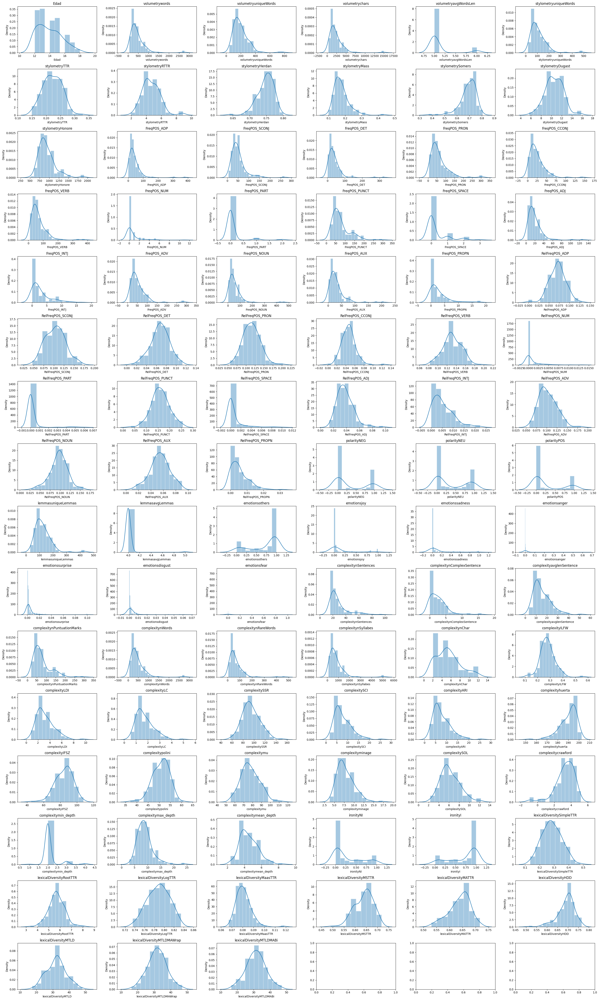

---------------------------------------PROBPLOT GRAPHICS---------------------------------------


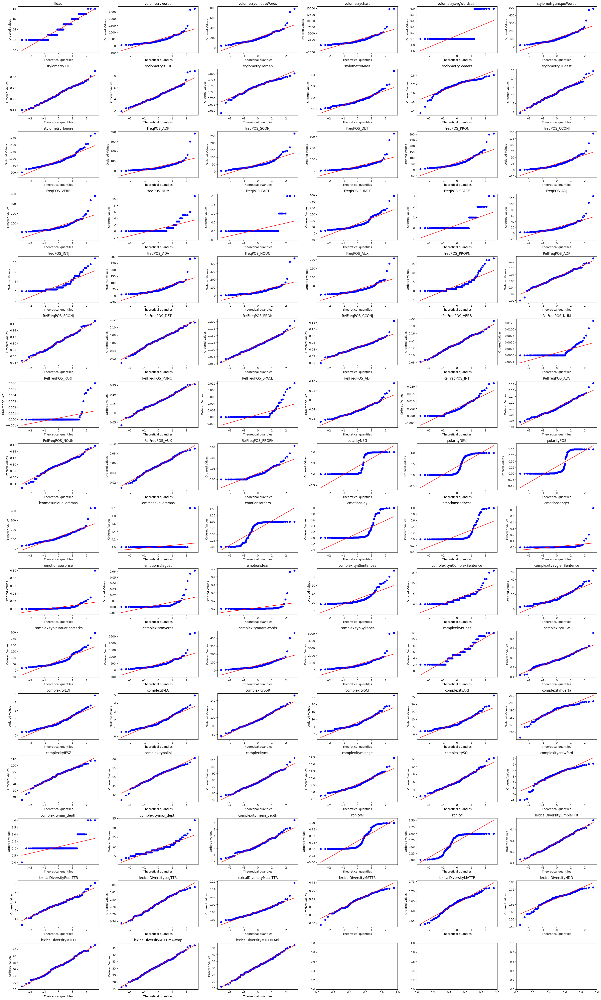

---------------------------------------KDE GRAPHICS---------------------------------------


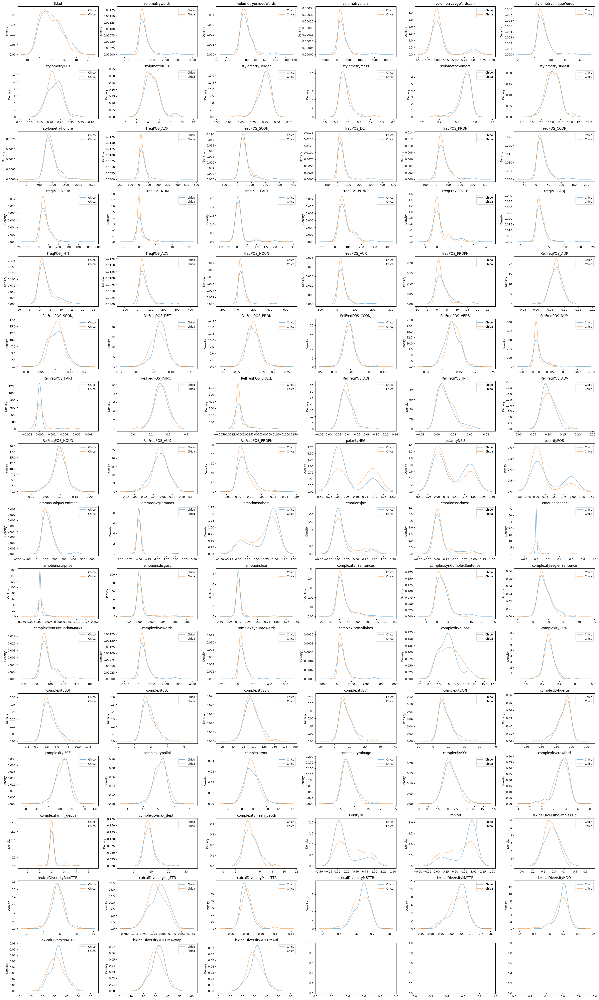

---------------------------------------BOXPLOT GRAPHICS---------------------------------------


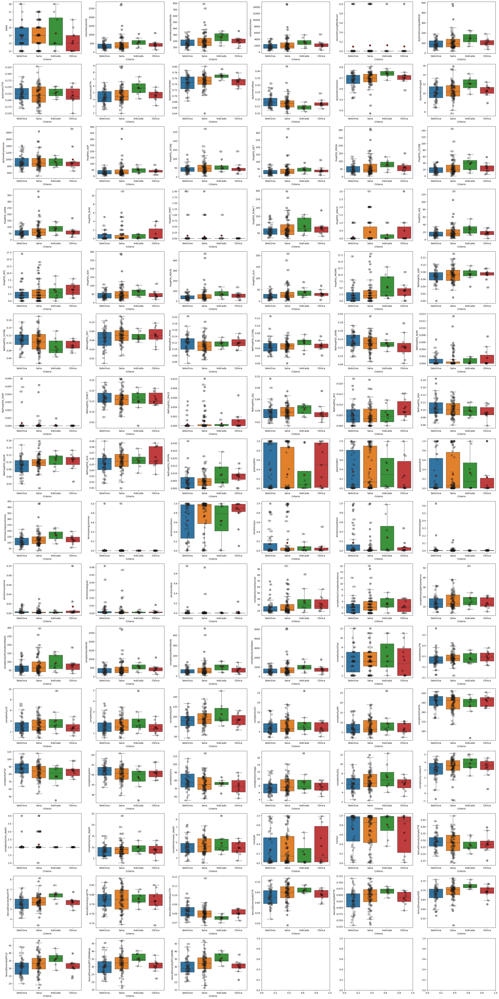

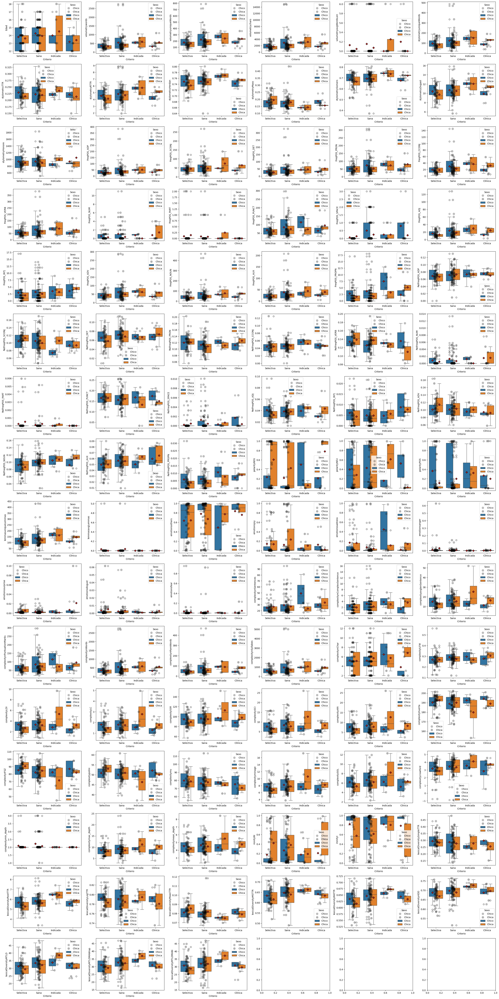

In [15]:
t=Test()
numeric_cols = [col for col, dtype in zip(df.columns, df.dtypes) if dtype != 'object']
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
testResults=t.report(df[df['Sexo']=="Chico"],df[df['Sexo']=="Chica"],"Hombre","Mujer",visualizer,'Sexo',['Criterio','Criterio'],[None,'Sexo'])

# Falta términos frecuentes según  categorias gramaticales (POS)

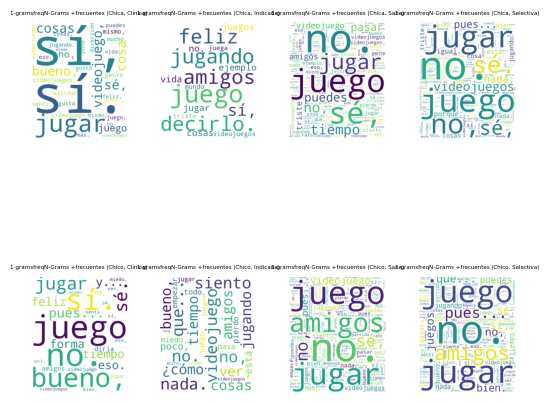

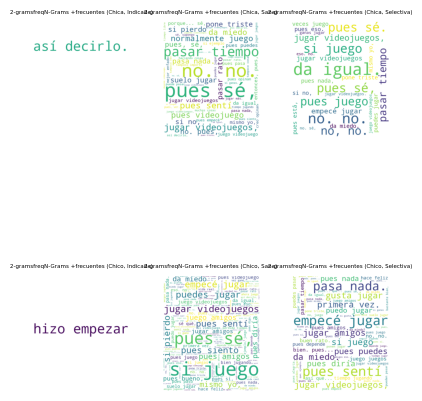

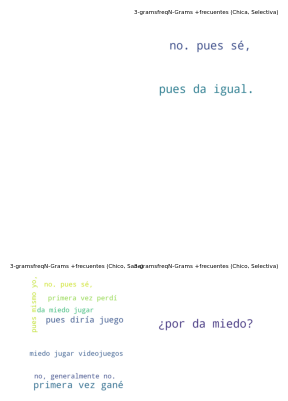

<Figure size 640x480 with 0 Axes>

In [7]:
from spacy.lang.es.stop_words import STOP_WORDS
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
new_df = pd.DataFrame()
for ngramas in [str(n+1)+"-gramsfreqN-Grams" for n in range(4)] :
    newdf = df.groupby(['Sexo', 'Criterio'])[ngramas].agg(lambda x: dict(sorted({k: sum(d.get(k, 0) for d in x) for k in set().union(*x)}.items(), key=lambda item:item[1], reverse=True))).reset_index()
    ngramsArray=[]
    for i in newdf.index:
        ngramsDict= newdf[ngramas][i].copy()
        for k in newdf[ngramas][i]:
            valid = False
            for e in k.split(' '):
                valid = True if (e not in STOP_WORDS and len(e) > 1) else False
            if not valid or  ngramsDict[k] < 3: 
                del ngramsDict[k]
        ngramsArray.append(ngramsDict)
    new_df[ngramas], new_df['Sexo'], new_df['Criterio'] = ngramsArray, newdf['Sexo'], newdf['Criterio']
visualizer.show_wordCloud(new_df,[str(n+1)+"-gramsfreqN-Grams" for n in range(4)], hspace= 1.2,titleGraphicSize= 4,groupby=['Sexo','Criterio'])


In [15]:
df['1-gramsfreqN-Grams'].iloc[0]

{'así': 1,
 'bien': 1,
 'bueno,': 1,
 'básicamente': 1,
 'casi': 1,
 'como...': 1,
 'cosa': 1,
 'cosa...': 1,
 'cosas...': 1,
 'creo': 1,
 'darme': 1,
 'debería': 1,
 'deberían': 1,
 'decir': 1,
 'decir.': 1,
 'desahogo,': 1,
 'despejar': 1,
 'entiendo': 1,
 'entretenimiento': 1,
 'está.': 1,
 'frustración': 1,
 'ganar': 1,
 'ganar,': 1,
 'ganar.': 1,
 'ganas': 1,
 'ganas.': 1,
 'gané...': 1,
 'gusta': 1,
 'gusta,': 1,
 'gustaba.': 1,
 'gustar': 1,
 'hago': 1,
 'mal': 1,
 'mente.': 1,
 'miedo?': 1,
 'misma': 1,
 'mismo': 1,
 'mismo?': 1,
 'mucho.': 1,
 'no.': 1,
 'normalmente': 1,
 'nunca.': 1,
 'opino': 1,
 'orgullosa': 1,
 'parece,': 1,
 'partida': 1,
 'perder': 1,
 'perdida': 1,
 'perdido.': 1,
 'permite': 1,
 'persona': 1,
 'piensa': 1,
 'pierdo,': 1,
 'porque...': 1,
 'primera': 1,
 'programa': 1,
 'pues': 1,
 'pues,': 1,
 'pues...': 1,
 'que,': 1,
 'que...': 1,
 'recuerdo.': 1,
 'relajación,': 1,
 'salida,': 1,
 'sentí': 1,
 'siento': 1,
 'siquiera': 1,
 'sucediendo': 1,
 'sé': 1

In [13]:
for c in df.columns:
    if 'grams' in c:
        print(c)

n-gramsn-grams
n-gramsfreqN-Grams
1-gramsn-grams
1-gramsfreqN-Grams
2-gramsn-grams
2-gramsfreqN-Grams
3-gramsn-grams
3-gramsfreqN-Grams
4-gramsn-grams
4-gramsfreqN-Grams


# POS

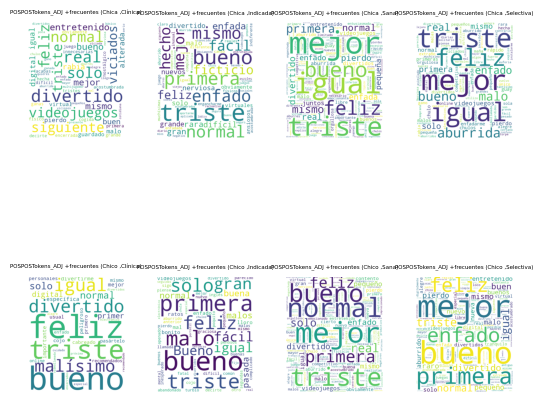

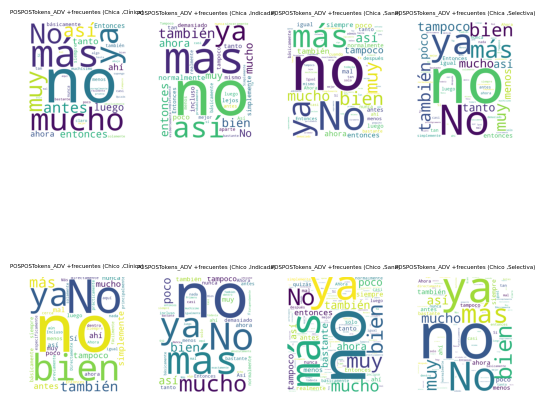

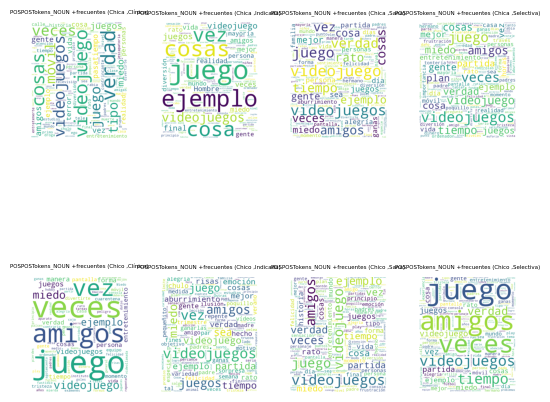

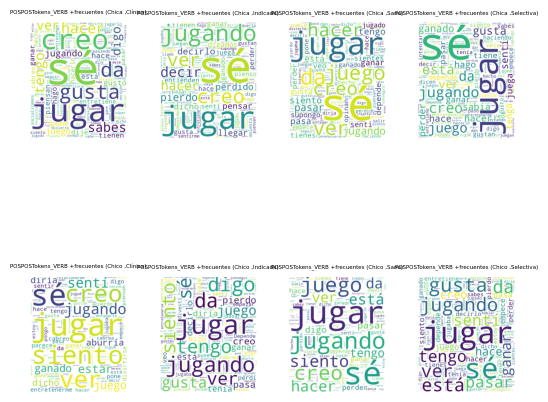

In [ ]:

POS_LIST = ["ADJ", "ADV", "NOUN", "VERB"]
visualizer=Visualization('/mnt/c/Users/UJA/Desktop//textflow/Examples/')
new_df = pd.DataFrame()
first=True
for pos in POS_LIST:
    df['POSPOSTokens'+"_"+pos] = [df['POSPOSTokens'][i].get(pos, []) for i in df.index]
    newdf = df.groupby(['Sexo', 'Criterio'])['POSPOSTokens_'+pos].agg(lambda x: dict(sorted({k: sum(d.get(k, 0) for d in x) for k in set().union(*x)}.items(), key=lambda item:item[1], reverse=True))).reset_index()
    newdf = newdf.drop(['Sexo', 'Criterio'], axis=1) if first==False else newdf
    first = False
    new_df = pd.concat([new_df, newdf], axis=1)
visualizer.show_wordCloud(new_df,['POSPOSTokens'+"_"+pos for pos in POS_LIST], hspace= 1.2,titleGraphicSize= 4,groupby=['Sexo','Criterio'])


# Inference

In [4]:
from textflow.Inference import Inference

inference = Inference()

c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Some weights of the model checkpoint at PlanTL-GOB-ES/roberta-base-bne were not used when initializing RobertaModel: ['lm_head.dense.bias', 'lm_head.dense.weight', 'lm_head.decoder.bias', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.decoder.weight', 'lm_head.bias']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceCla

In [5]:
#select the features
df = df.fillna(0)
numeric_cols = [col for col, dtype in zip(df.columns, df.dtypes) if dtype != 'object']
X = df[numeric_cols]
y = df['Criterio']
df.shape

(144, 106)

In [5]:
X

,Edad,volumetrywords,volumetryuniqueWords,volumetrychars,volumetryavgWordsLen,stylometryuniqueWords,stylometryTTR,stylometryRTTR,stylometryHerdan,stylometryMass,...,lexicalDiversitySimpleTTR,lexicalDiversityRootTTR,lexicalDiversityLogTTR,lexicalDiversityMaasTTR,lexicalDiversityMSTTR,lexicalDiversityMATTR,lexicalDiversityHDD,lexicalDiversityMTLD,lexicalDiversityMTLDMAWrap,lexicalDiversityMTLDMABi
0,13,210,132,1159,6,64,0.239700,3.916736,0.744353,0.190152,...,0.318352,5.201916,0.795141,0.084425,0.572000,0.571560,0.646932,25.919298,23.172285,22.020526
1,16,409,196,2101,5,108,0.222222,4.898979,0.756866,0.157979,...,0.269547,5.942281,0.788075,0.078881,0.662222,0.641922,0.708650,32.587322,32.934156,32.901511
2,14,141,88,743,5,40,0.235294,3.067860,0.718268,0.244834,...,0.388235,5.061969,0.815775,0.082596,0.620000,0.640496,0.653793,26.511682,26.841176,26.991648
3,15,598,261,3045,5,169,0.248529,6.480854,0.786542,0.121814,...,0.274336,7.143287,0.801600,0.070076,0.658462,0.654340,0.711610,31.927581,33.143068,32.918554
4,14,286,149,1500,5,76,0.226866,4.152324,0.744863,0.182117,...,0.298507,5.463584,0.792065,0.082349,0.683333,0.676573,0.699070,39.990750,36.262687,36.898698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,13,120,85,612,5,38,0.250000,3.082207,0.724059,0.241237,...,0.394737,4.866643,0.814976,0.084801,0.593333,0.588350,0.625466,23.523810,22.243421,21.470985
140,14,1087,358,5479,5,190,0.149489,5.329431,0.734100,0.158952,...,0.151062,5.385530,0.735565,0.085188,0.621600,0.621718,0.696784,29.910022,28.863100,29.083484
141,12,367,198,1996,5,96,0.209607,4.485785,0.744972,0.172697,...,0.270563,5.815526,0.786939,0.079959,0.660000,0.662567,0.690977,33.551131,32.443723,32.965857
142,15,325,174,1606,5,79,0.201018,3.985023,0.731434,0.193493,...,0.267176,5.296549,0.779061,0.085160,0.637143,0.634826,0.680475,29.826615,29.913486,30.169811


In [18]:
# Remove Features with low variance
print('------- Remove Features with low variance -------')
inference.removeLowVarianceEntities(X)

# Univariate feature selection
print('------- Univariate feature selection -------')
inference.univariateFeatureSelection(X,y, k=10)

# Feature selection using SelectFromModel
print('------- Feature selection using SelectFromModel -------')
inference.featureSelectionSelectFromModel(X,y)

print('------- Sequencial Feature Selection -------')
# Sequencial Feature Selection
label2id = {k: i for i, k in enumerate(['Selectiva', 'Sana', 'Indicada', 'Clínica'])}
yAux= df['Criterio'].apply(lambda x: label2id[x]).to_numpy()
inference.sequentialFeatureSelection(X,yAux,2)

------- Remove Features with low variance -------


,Edad,volumetrywords,volumetryuniqueWords,volumetrychars,volumetryavgWordsLen,stylometryuniqueWords,stylometryTTR,stylometryRTTR,stylometryHerdan,stylometryMass,...,lexicalDiversitySimpleTTR,lexicalDiversityRootTTR,lexicalDiversityLogTTR,lexicalDiversityMaasTTR,lexicalDiversityMSTTR,lexicalDiversityMATTR,lexicalDiversityHDD,lexicalDiversityMTLD,lexicalDiversityMTLDMAWrap,lexicalDiversityMTLDMABi
0,13.0,210.0,132.0,1159.0,6.0,64.0,0.239700,3.916736,0.744353,0.190152,...,0.318352,5.201916,0.795141,0.084425,0.572000,0.571560,0.646932,25.919298,23.172285,22.020526
1,16.0,409.0,196.0,2101.0,5.0,108.0,0.222222,4.898979,0.756866,0.157979,...,0.269547,5.942281,0.788075,0.078881,0.662222,0.641922,0.708650,32.587322,32.934156,32.901511
2,14.0,141.0,88.0,743.0,5.0,40.0,0.235294,3.067860,0.718268,0.244834,...,0.388235,5.061969,0.815775,0.082596,0.620000,0.640496,0.653793,26.511682,26.841176,26.991648
3,15.0,598.0,261.0,3045.0,5.0,169.0,0.248529,6.480854,0.786542,0.121814,...,0.274336,7.143287,0.801600,0.070076,0.658462,0.654340,0.711610,31.927581,33.143068,32.918554
4,14.0,286.0,149.0,1500.0,5.0,76.0,0.226866,4.152324,0.744863,0.182117,...,0.298507,5.463584,0.792065,0.082349,0.683333,0.676573,0.699070,39.990750,36.262687,36.898698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,13.0,120.0,85.0,612.0,5.0,38.0,0.250000,3.082207,0.724059,0.241237,...,0.394737,4.866643,0.814976,0.084801,0.593333,0.588350,0.625466,23.523810,22.243421,21.470985
140,14.0,1087.0,358.0,5479.0,5.0,190.0,0.149489,5.329431,0.734100,0.158952,...,0.151062,5.385530,0.735565,0.085188,0.621600,0.621718,0.696784,29.910022,28.863100,29.083484
141,12.0,367.0,198.0,1996.0,5.0,96.0,0.209607,4.485785,0.744972,0.172697,...,0.270563,5.815526,0.786939,0.079959,0.660000,0.662567,0.690977,33.551131,32.443723,32.965857
142,15.0,325.0,174.0,1606.0,5.0,79.0,0.201018,3.985023,0.731434,0.193493,...,0.267176,5.296549,0.779061,0.085160,0.637143,0.634826,0.680475,29.826615,29.913486,30.169811


------- Univariate feature selection -------
KBest f_classif ['stylometryRTTR' 'stylometryDugast' 'emotionssadness' 'emotionssurprise'
 'complexityIFSZ' 'lexicalDiversityRootTTR' 'lexicalDiversityMaasTTR'
 'lexicalDiversityMATTR' 'lexicalDiversityHDD' 'lexicalDiversityMTLD']
KBest Mutual Information ['volumetrywords' 'FreqPOS_ADP' 'RelFreqPOS_SCONJ' 'RelFreqPOS_VERB'
 'RelFreqPOS_NOUN' 'lemmasuniqueLemmas' 'complexitynWords'
 'lexicalDiversityLogTTR' 'lexicalDiversityMTLDMAWrap'
 'lexicalDiversityMTLDMABi']
(144, 23)
Index(['volumetrywords', 'volumetrychars', 'stylometryuniqueWords',
       'stylometryHonore', 'FreqPOS_ADP', 'FreqPOS_SCONJ', 'FreqPOS_DET',
       'FreqPOS_PRON', 'FreqPOS_CCONJ', 'FreqPOS_VERB', 'FreqPOS_PUNCT',
       'FreqPOS_ADV', 'FreqPOS_AUX', 'lemmasuniqueLemmas',
       'complexitynSentences', 'complexitynPuntuationMarks',
       'complexitynWords', 'complexitynSyllabes', 'complexitySSR',
       'complexityhuerta', 'complexityIFSZ', 'complexitymu',
       'lexica

c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\sklearn\svm\_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\UJA\Desktop\textflow-GitHub\textflow\.venv\lib\site-packages\sklearn\base.py:458: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


,volumetrywords,volumetrychars,stylometryuniqueWords,stylometryHonore,FreqPOS_ADP,FreqPOS_SCONJ,FreqPOS_DET,FreqPOS_PRON,FreqPOS_CCONJ,FreqPOS_VERB,...,lemmasuniqueLemmas,complexitynSentences,complexitynPuntuationMarks,complexitynWords,complexitynSyllabes,complexitySSR,complexityhuerta,complexityIFSZ,complexitymu,lexicalDiversityMTLD
0,210.0,1159.0,64.0,862.759560,11.0,37.0,17.0,28.0,9.0,38.0,...,82.0,20.0,57.0,210.0,361.0,86.294500,195.098571,89.238333,74.452189,25.919298
1,409.0,2101.0,108.0,1000.540404,38.0,31.0,41.0,46.0,29.0,67.0,...,128.0,24.0,77.0,409.0,681.0,95.661117,188.458478,86.061548,70.967883,32.587322
2,141.0,743.0,40.0,811.072335,11.0,19.0,8.0,20.0,7.0,27.0,...,60.0,19.0,29.0,141.0,232.0,85.710686,198.283292,96.906146,77.035772,26.511682
3,598.0,3045.0,169.0,1407.923548,66.0,62.0,60.0,66.0,36.0,87.0,...,183.0,19.0,80.0,598.0,1020.0,126.461559,173.713431,69.097102,65.536159,31.927581
4,286.0,1500.0,76.0,738.090021,24.0,40.0,23.0,28.0,16.0,50.0,...,97.0,25.0,49.0,286.0,499.0,104.214652,194.124347,86.696748,80.924937,39.990750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,120.0,612.0,38.0,1381.834272,9.0,16.0,6.0,18.0,8.0,27.0,...,57.0,25.0,32.0,120.0,201.0,82.258200,200.939000,97.682500,85.504483,23.523810
140,1087.0,5479.0,190.0,786.383539,90.0,142.0,111.0,150.0,58.0,169.0,...,194.0,56.0,184.0,1087.0,1783.0,94.439751,186.056895,85.233945,76.492198,29.910022
141,367.0,1996.0,96.0,654.982272,33.0,34.0,28.0,45.0,22.0,72.0,...,118.0,43.0,92.0,370.0,661.0,78.889208,196.991364,86.932241,62.624933,33.551131
142,325.0,1606.0,79.0,891.117441,31.0,35.0,29.0,54.0,15.0,42.0,...,103.0,32.0,68.0,325.0,516.0,73.052791,195.528010,97.765519,89.639229,29.826615


(SequentialFeatureSelector(estimator=RidgeCV(alphas=array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])),
                           n_features_to_select=2),
 SequentialFeatureSelector(direction='backward',
                           estimator=RidgeCV(alphas=array([1.e-06, 1.e-03, 1.e+00, 1.e+03, 1.e+06])),
                           n_features_to_select=2))

## Inferencial Analysis

### Multiclass classification

In [7]:
df['Edad']=df['Edad'].astype(str)

In [8]:
dic_categorias = {
    'Criterio': ['Selectiva', 'Sana', 'Indicada', 'Clínica'],
    'Sexo': ['Chico', 'Chica'],
    'Edad': ["13", "16", "14", "15", "17", "12", "18"]
}

label2id = {k: i for i, k in enumerate(dic_categorias['Criterio'])}
id2label = list(dic_categorias['Criterio'])
print(label2id, id2label)


# Diferenciamos características por edades
data = []
cols = ['id_PRECOM']
ext_numeric_cols = []
for edad in dic_categorias['Edad']:
    for feat in numeric_cols:
      colname = f'{edad}_{feat}'
      ext_numeric_cols.append(colname)
cols += ['Criterio', 'Sexo'] + ext_numeric_cols
for id in df['id_PRECOM'].unique():
  sample = df[df['id_PRECOM'] == id]
  row = [id, sample['Criterio'].unique()[0], sample['Sexo'].unique()[0]]
  df1 =  df[df['id_PRECOM'] == id]
  for edad in dic_categorias['Edad']:
      df2 =  df1[df1['Edad'] == edad]
      for feat in numeric_cols:
        try:
          val = df2[feat].iloc[0]
        except:
          val = 0
        row.append(val)
  data.append(row)
ext_df = pd.DataFrame(data, columns=cols)

{'Selectiva': 0, 'Sana': 1, 'Indicada': 2, 'Clínica': 3} ['Selectiva', 'Sana', 'Indicada', 'Clínica']


In [54]:
print('------- With Generated Features -------')
#With Generated Features
print(inference.classificationWithFeatures(ext_df, ext_numeric_cols, 'Criterio', label2id, 'Sexo'))
print('------- With BoW -------')
#With BoW
tdf = df[['id_PRECOM', 'Criterio', 'Sexo', 'text']]
tdf['text'] = tdf.groupby(['id_PRECOM'])['text'].transform(lambda x: (' '.join(x)).lower())
tdf = tdf.drop_duplicates(ignore_index=True)
print(inference.classificationBoW(tdf, 'Criterio', label2id, 'Sexo'))
print('------- With Deep Vectors -------')
#With Deep Vectors
ddf = tdf.copy()
ddf['encoding'] = ddf.apply(lambda x: inference.gen_encodings(x['text']), axis=1)
print(inference.classificationDeepVectors(ddf, label2id, 'Criterio', 'text', 'Sexo'))

------- With Generated Features -------
------- With BoW -------
{'Chico':                      accuracy precision    recall   f-score
Logistic regression  0.895425  0.802315  0.895425  0.846175
SVM                  0.895425  0.802315  0.895425  0.846175
RandomForest         0.895425  0.802315  0.895425  0.846175
KNN                  0.895425  0.802315  0.895425  0.846175
MLP                  0.895425  0.802315  0.895425  0.846175
SGD                   0.88366  0.801018   0.88366  0.840127
Decision tree        0.801307  0.813923  0.801307  0.805009, 'Chica':                      accuracy precision    recall   f-score
Logistic regression  0.845455   0.71584  0.845455  0.774978
SVM                  0.845455   0.71584  0.845455  0.774978
RandomForest         0.845455   0.71584  0.845455  0.774978
KNN                  0.845455   0.71584  0.845455  0.774978
MLP                  0.845455   0.71584  0.845455  0.774978
SGD                  0.827273  0.712865  0.827273  0.765505
Decision tree  

### Binary Classification 

In [10]:
label2id = {'Sana': 0, 'Selectiva': 0, 'Clínica': 1, 'Indicada': 1}
id2label = ['Sana+Selectiva', 'Indicada+Clínica']

#With Feaures
print('------- With Generated Features -------')
print(inference.classificationWithFeatures(ext_df, ext_numeric_cols, 'Criterio', label2id, 'Sexo', False))
#BoW
print('------- With BoW -------')
tdf = df[['id_PRECOM', 'Criterio', 'Sexo', 'text']]
tdf['text'] = tdf.groupby(['id_PRECOM'])['text'].transform(lambda x: (' '.join(x)).lower())
tdf = tdf.drop_duplicates(ignore_index=True)
print(inference.classificationBoW(tdf, 'Criterio', label2id, 'Sexo'))
#Deep Vectors
print('------- With Deep Vectors -------')
ddf = tdf.copy()
ddf['encoding'] = ddf.apply(lambda x: inference.gen_encodings(x['text']), axis=1)
print(inference.classificationDeepVectors(ddf, label2id, 'Criterio', 'text', 'Sexo',True))
#Combining all Features

print('------- Combining all Features -------')
sdf = ext_df.dropna()
stdf = tdf.dropna()
sddf = ddf.dropna()
all_df = pd.merge(pd.merge(sdf, stdf), sddf)
print('  ----- For boys -----')
print(inference.combine_all_features(label2id, all_df, ext_numeric_cols, 'Sexo', 'Chico', 'text', 'Criterio'))
print('  ----- For girls -----')
print(inference.combine_all_features(label2id, all_df, ext_numeric_cols, 'Sexo', 'Chica', 'text', 'Criterio'))

------- With Generated Features -------
{'Chico':                      accuracy precision    recall   f-score
SVM                  0.895425  0.802315  0.895425  0.846175
Logistic regression  0.871895   0.79972  0.871895  0.834078
KNN                  0.871895  0.799547  0.871895  0.833675
MLP                  0.860131  0.799541  0.860131  0.827614
Decision tree        0.811765  0.846886  0.811765   0.82257
RandomForest         0.848366  0.796569  0.848366   0.82073
SGD                  0.801307  0.792726  0.801307  0.794884, 'Chica':                      accuracy precision    recall   f-score
Logistic regression  0.845455  0.759275  0.845455  0.795758
SGD                  0.790909  0.795984  0.790909  0.784637
RandomForest         0.828788  0.741093  0.828788  0.781472
SVM                  0.845455   0.71584  0.845455  0.774978
KNN                  0.845455   0.71584  0.845455  0.774978
Decision tree        0.810606  0.738118  0.810606  0.771998
MLP                  0.775758  0.727074 

,accuracy,precision,recall,f-score
Logistic regression,0.845455,0.759275,0.845455,0.795758
MLP,0.828788,0.741093,0.828788,0.781472
SVM,0.845455,0.71584,0.845455,0.774978
RandomForest,0.845455,0.71584,0.845455,0.774978
KNN,0.845455,0.71584,0.845455,0.774978
SGD,0.775758,0.731451,0.775758,0.751948
Decision tree,0.687879,0.71532,0.687879,0.698562
